# House Price Prediction

I am using Housing Price dataset. This data set has several features related to respective houses. SalesPrice is the target variable (y) and using rest of the features as Independent variables (x).


## **Introduction**

This notebook is going to be focused on solving the problem of predicting house prices for house buyers and house sellers.

We are going to take advantage of all of the feature variables available to use and use it to analyze and predict house prices.

We are going to break everything into logical steps that allow us to ensure the cleanest, most realistic data for our model to make accurate predictions from.

1.Load Data and Packages

2.Analyzing the Test Variable (Sale Price)

3.Multivariable Analysis

4.Impute Missing Data 

5.Exploratory Data Analysis

6.Modeling and Predictions

## 1. Loading Data and Packages

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
import pandas_profiling
from sklearn import metrics
from subprocess import check_output
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
!pip -q install plotly-express

     |████████████████████████████████| 6.8MB 3.4MB/s 


In [0]:
# Code for displaying plotly express plots inline in colab
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
  
import plotly_express as px

In [4]:
df=pd.read_csv("https://raw.githubusercontent.com/insaid2018/Term-2/master/Projects/house_data.csv")
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,...,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,...,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,...,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,...,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,...,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,...,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,...,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,...,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,...,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,...,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,

## Understanding The Dataset

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [6]:
df.shape

(1460, 81)

In [7]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Pre_Profiling

In [8]:
profile = pandas_profiling.ProfileReport(df)
profile.to_file(outputfile="SalePrice_before_preprocessing.html")
profile

Number of variables,81
Number of observations,1460
Total Missing (%),5.9%
Total size in memory,924.0 KiB
Average record size in memory,648.1 B
Numeric,38
Categorical,43
Boolean,0
Date,0
Text (Unique),0
Rejected,0


## 2. Analyzing the Test Variable (Sale Price)

We will check out the most interesting feature in this study: Sale Price

In [9]:
df["SalePrice"].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

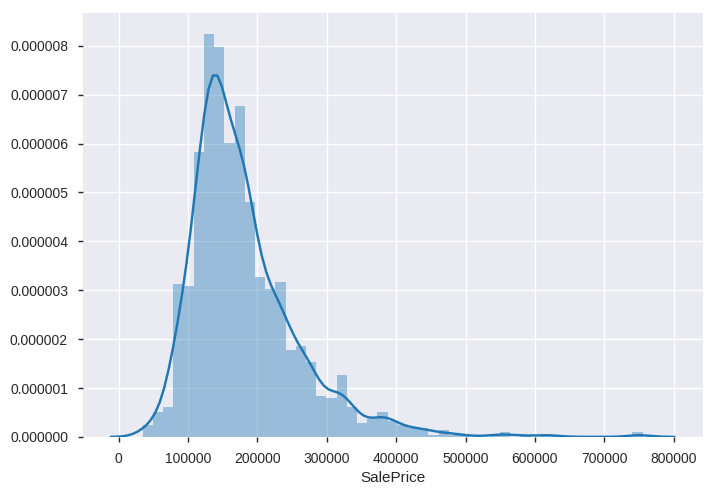

In [10]:
# Plot Histogram
sns.distplot(df['SalePrice'])

In [11]:
#skewness and kurtosis
print("Skewness: %f" % df['SalePrice'].skew())
print("Kurtosis: %f" % df['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


Most of the density lies between 100k and 250k, and outliers appears on the costlier side.

From the graph, we can see that the data:

*   Deviate from the normal distribution
*   Have appreciable positive skewness.
*   Showing higher peak.







This can reduce the performance of the ML regression models because some assume normal distribution,

Therfore we make a log transformation, the resulting distribution looks much better.

Skewness: 0.121335
Kurtosis: 0.809532


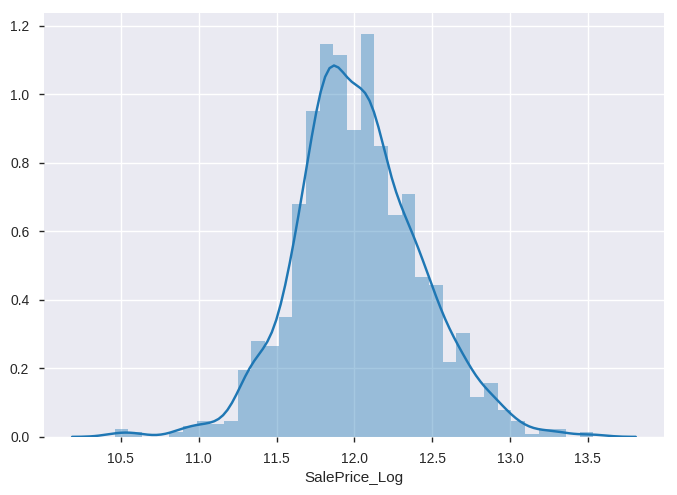

In [12]:
df['SalePrice_Log'] = np.log(df['SalePrice'])

sns.distplot(df['SalePrice_Log']);

# skewness and kurtosis
print("Skewness: %f" % df['SalePrice_Log'].skew())
print("Kurtosis: %f" % df['SalePrice_Log'].kurt())


## 3. Multivariable Analysis

Now we will check out all the variables! There are two types of features in housing data, categorical and numerical.

**Categorical data** is in categories. It is not necessarily linear, but it follows some kind of pattern. 

**Numerical data** is data in number form. These features are in a linear relationship with each other. 

**There are some variable which Python by default taken as numerical but they are categorical, so it is important to convert them into a categorical variable.**

In [13]:
# Checking Categorical Data
categorical = df.select_dtypes(include=['object','category']).columns
categorical

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [14]:
numerical = df.select_dtypes(include=['int64','float64']).columns
numerical

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice', 'SalePrice_Log'],
      dtype='object')

In [15]:
cat = len(df.select_dtypes(include=['object','category']).columns)
num = len(df.select_dtypes(include=['int64','float64']).columns)
print('Total Features: ', cat, 'categorical', '+',
      num, 'numerical', '=', cat+num, 'features')

Total Features:  43 categorical + 39 numerical = 82 features


### Correlation between the attributes

Separate variable into new dataframe from original dataframe which has only numerical values

In [0]:
df_corr = df.select_dtypes(include=['int64','float64'])

In [17]:
df_corr.shape

(1460, 39)

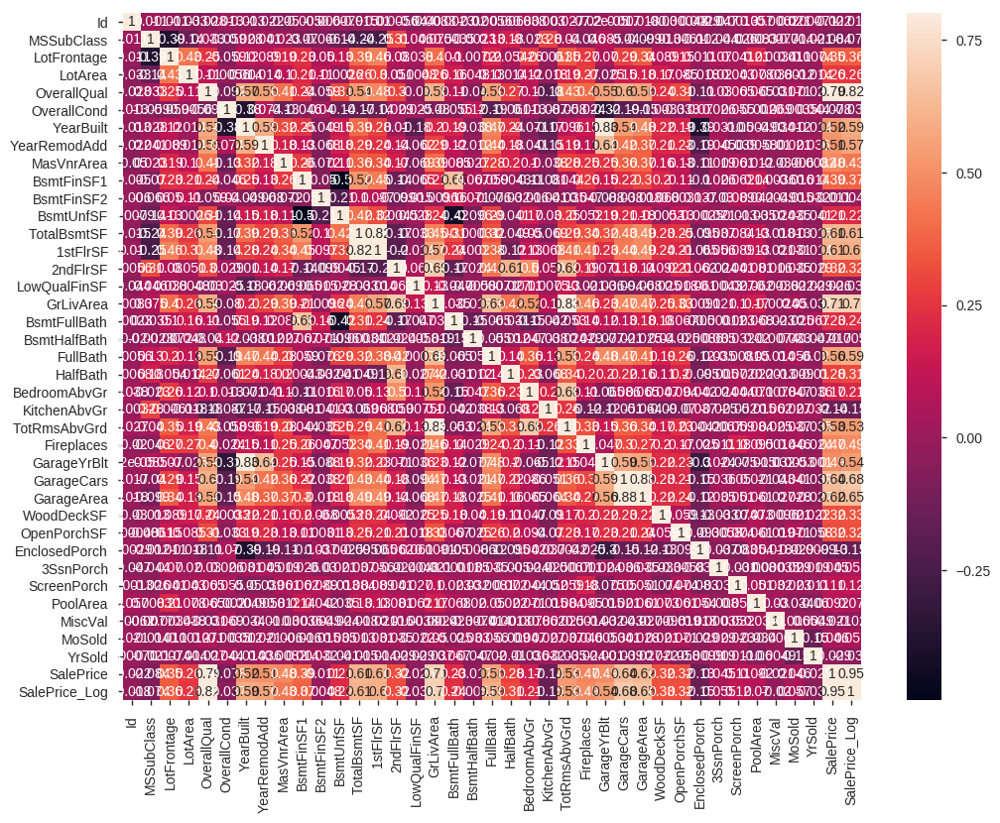

In [18]:
corrmat = df_corr.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, annot=True)

We can see the highly correlated variables


*   The first one refers to the 'TotalBsmtSF' and '1stFlrSF' variables
*   The second one refers to the 'GarageCars' and 'GarageArea' variables. 


Both cases show how significant the correlation is between these variables. Actually, this correlation is so strong that they give almost the same information so multicollinearity really occurs. Heatmaps are great to detect this kind of situations and in problems dominated by feature selection.


**Now we will see the 'SalePrice' correlations. Actually there are many other variables that should be taken into account. We also see there correlation.**

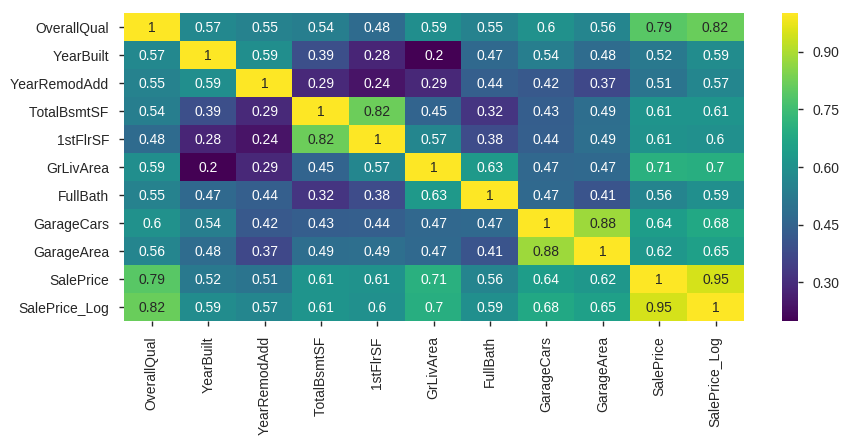

In [19]:
imp_feature = corrmat.index[abs(corrmat['SalePrice_Log']>0.55)]
plt.subplots(figsize=(10,4))
top_corr = df[imp_feature].corr()
sns.heatmap(top_corr, annot=True,cmap='viridis',linecolor="white")
plt.show()

From the matrix, we can see that:

⦁	“OverallQual” is highly correlated with target feature of Saleprice by 82%.

⦁	“GarageCars” and “GarageArea” are also some of the most strongly correlated variables. The number of cars that fit into the garage depends on the garage area. Even "GarageCars" and 'GarageArea' are strongly correlated to SalePrice.

⦁	'GrLivArea' and 'TotalBsmtSF' are strongly correlated with 'SalePrice'.

⦁	'TotalBsmtSF' and '1stFlrSF' are strongly correlated with each other.

⦁	'FullBath' and 'GrLivArea' are also strongly correlated with each other.

⦁	'YearBuilt' and 'YearRemodAdd' are strongly correlated to each other.




**Now we will see the correlation between 'SalePrice' and other variables**

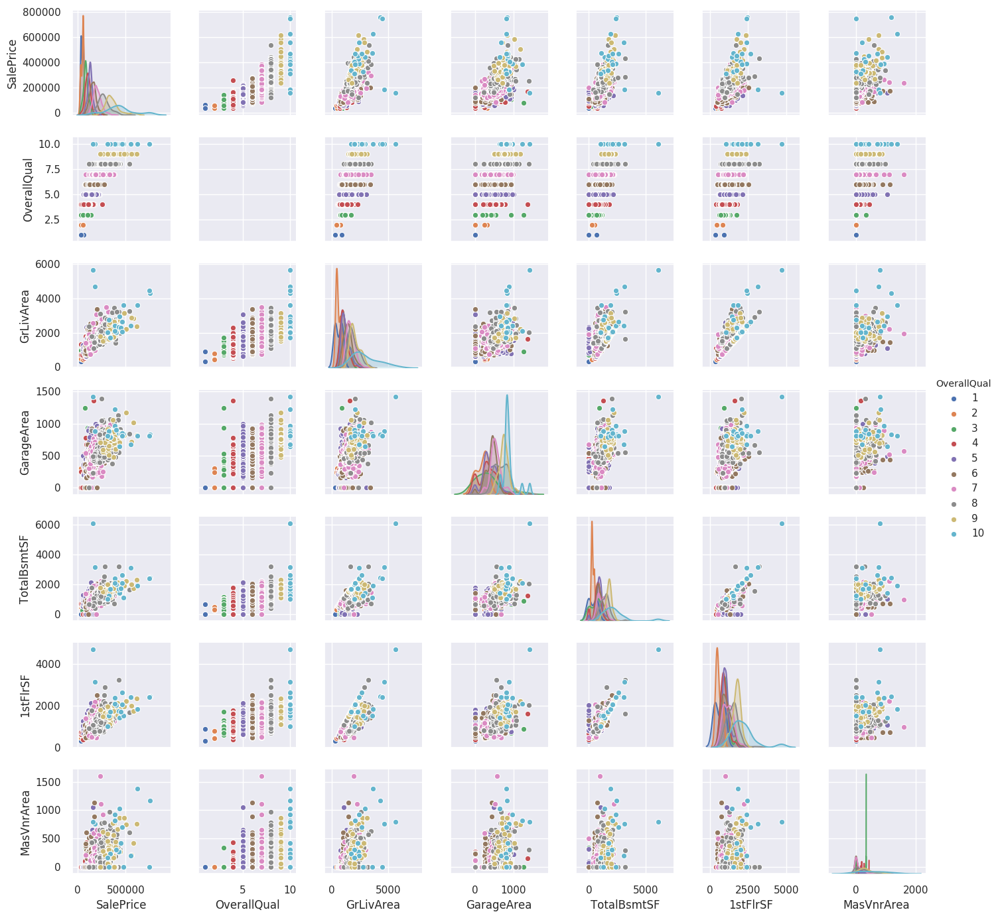

In [20]:
#scatterplot
sns.set()
columns = ['SalePrice',"OverallQual",'GrLivArea', 'GarageArea', 'TotalBsmtSF', '1stFlrSF','MasVnrArea']
sns.pairplot(df[columns], size = 2, hue="OverallQual")
plt.show()

Although we already know some of the main figures, this scatter plot gives us a reasonable idea about variables relationships.

*  One of the interesting figures is the one between 'TotalBsmtSF' and 'GrLiveArea'. In this figure we can see the dots drawing a linear line, which almost acts like a border. It totally makes sense that the majority of the dots stay below that line.
* Even from this, we can see that some houses does not have basement as the TotalBsmtSF is 0. 

*   The plot between 'SalePrice' and 'YearBuilt' can also be interesting. As the 'YearBuilt' pass by the 'SalePrice' is increasing.


## **List of features with missing values**

In [21]:
#missing data
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(10)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageQual,81,0.055479
GarageCond,81,0.055479
GarageFinish,81,0.055479
GarageType,81,0.055479


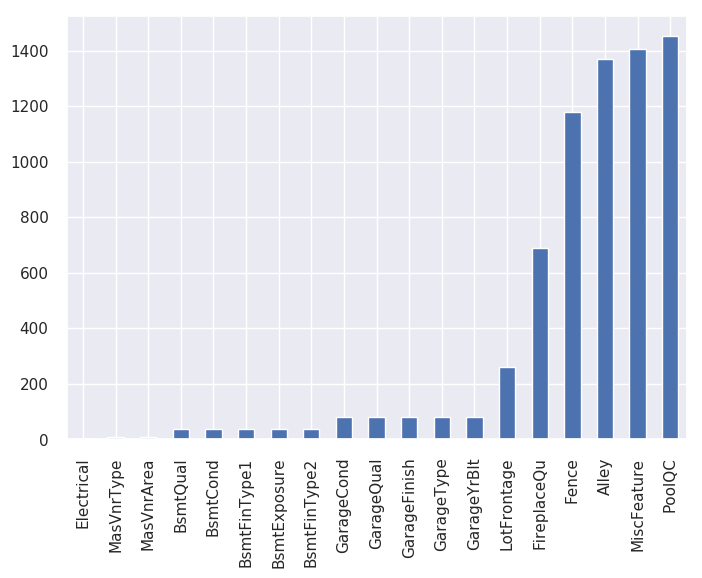

In [22]:
# Counting number of missing values in a particular column

missing_val = df.isnull().sum()
missing_val = missing_val[missing_val > 0]
missing_val.sort_values(inplace=True)
missing_val.plot.bar()

19 attributes have missing values,

For a few columns there is lots of NaN entries.
However, reading the data description we find this is not missing data:

For PoolQC, NaN is not missing data but means no pool, likewise for Fence, FireplaceQu etc.

### **Imputing missing values**

Missing values in the data set can affect prediction or classification of a model negatively.

In [0]:
# PoolQC has missing value ratio is more than 99%. So we fill it by None
df['PoolQC'] = df['PoolQC'].fillna('None')

In [0]:
#Arround 50% of missing values attributes have been fill by None

df['MiscFeature'] = df['MiscFeature'].fillna('None')

**Fence**

Fence has got 1179 null values. We can safely assume that those houses doesn't have a Fence and replace those values with None

In [0]:
df['Fence'] = df['Fence'].fillna('None')

**Fireplaces**

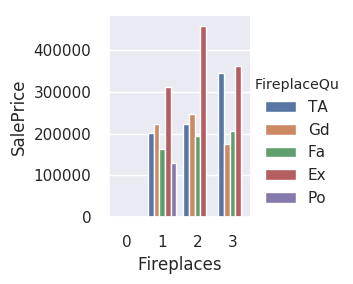

In [26]:
sns.factorplot("Fireplaces","SalePrice",kind="bar",data=df,hue="FireplaceQu",size=3, aspect=1,ci=None)

Having 2 fireplaces increases house price and fireplace of Excellent quality is a big plus.

In [0]:
df['FireplaceQu'] = df['FireplaceQu'].fillna('None')

**Alley**

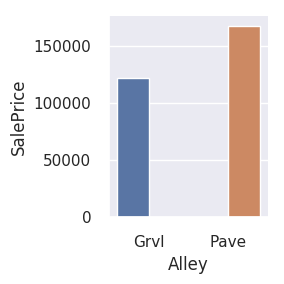

In [28]:
sns.factorplot("Alley","SalePrice",kind="bar",data=df,hue="Alley",size=3, aspect=1,ci=None)

All missing value indicate that particular house doesn't have an alley access.we can replace it with 'None'.

In [0]:
df["Alley"] = df["Alley"].fillna('None')

**LotFrontage**

In [0]:
# Using Group by of neighborhood and fill in missing value by the median of LotFrontage of all the neighborhood
df['LotFrontage'] = df.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))

**Garage Features**

In [0]:
#These columns like GarageType, GarageFinish, GarageQual and GarageCond are replacing with None
for column in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    df[column] = df[column].fillna('None')

In [0]:
for column in ['GarageYrBlt']:
    df[column]=df[column].fillna(0)

In [0]:
#The columns GarageArea is replacing with zero
for column in ['GarageArea']:
    df[column] = df[column].fillna(int(0))

**Basement features**

In [0]:
#The columns BsmtFinType2, BsmtExposure, BsmtFinType1, BsmtCond, BsmtQual are replacing with None
for column in ('BsmtFinType2', 'BsmtExposure', 'BsmtFinType1', 'BsmtCond', 'BsmtQual'):
    df[column] = df[column].fillna('None')

**MasVnrArea**

In [0]:
#MasVnrArea,we will replace with zero
df['MasVnrArea'] = df['MasVnrArea'].fillna(int(0))

**MasVnrType**

In [0]:
#MasVnrType, we will replace with None
df['MasVnrType'] = df['MasVnrType'].fillna('None')

**Electrical**

In [0]:
#We can replace missing values with most frequent ones.
df["Electrical"] = df["Electrical"].fillna('SBrkr')

In [38]:
#missing data
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()


,Total,Percent
SalePrice_Log,0,0.0
YearRemodAdd,0,0.0
RoofMatl,0,0.0
Exterior1st,0,0.0
Exterior2nd,0,0.0


## Post_Processing

In [39]:
profile = pandas_profiling.ProfileReport(df)
profile.to_file(outputfile="SalePrice_after_preprocessing.html")
profile

Number of variables,82
Number of observations,1460
Total Missing (%),0.0%
Total size in memory,935.4 KiB
Average record size in memory,656.1 B
Numeric,38
Categorical,43
Boolean,0
Date,0
Text (Unique),0
Rejected,1


 **Now no missing values in the data**

## Questions


### 1.   **How Overall Quality related to SalePrice?**




Text(0.5, 0, 'Sale Price')

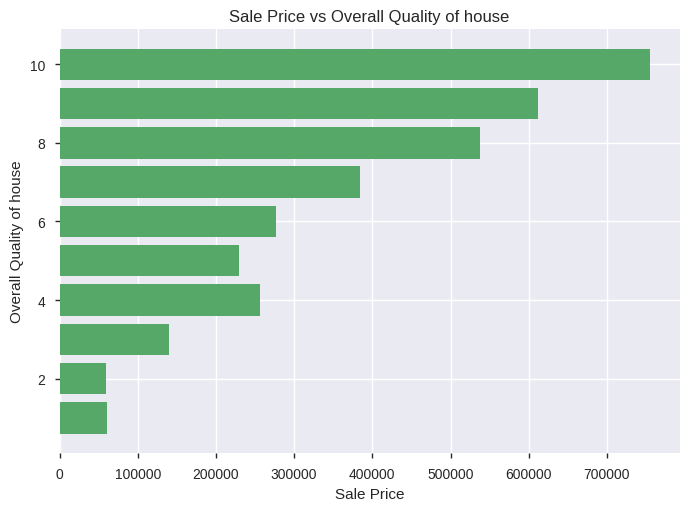

In [40]:
plt.barh(df["OverallQual"],width=df["SalePrice"],color="g")
plt.title("Sale Price vs Overall Quality of house")
plt.ylabel("Overall Quality of house")
plt.xlabel("Sale Price")

From the above graph, we can see that 

Overall Quality is positively correlated to SalePrice.

As Overall Quality getting better, the SalePrice increases.

### **2. How the variable 1st Floor in square feet is related to Sale Price?**

In [41]:
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go
init_notebook_mode(connected=True)

In [42]:
configure_plotly_browser_state()
px.scatter(df, x="1stFlrSF", y="SalePrice")

1st floor in sqr ft is in linear relationship with each other

**Analysing Total Basement and 1st floor correlated to each other**

In [43]:
configure_plotly_browser_state()
px.scatter(df, x="TotalBsmtSF", y="1stFlrSF")

From the above graph, we can see that, 

- Total basement and 1st floor in SF are in linear relationship with each other.

- Some houses does not have basement.

### **3. How Total Basement and Sale price are related?**

In [44]:
configure_plotly_browser_state()
px.scatter(df, x="TotalBsmtSF", y="SalePrice")

From the above graph, we can see that

Total basement area in sqr feet is in positive relationship with SalePrice



**Outlier removal**

There are certain outliers in the data, so it is necessary to remove them to get better distribution of the data.

In [45]:
# by consdering 99.5 percentie, we are removing outliers
upperlimit = np.percentile(df["TotalBsmtSF"].values, 99.5)
df['TotalBsmtSF'].ix[df['TotalBsmtSF']>upperlimit] = upperlimit

configure_plotly_browser_state()
px.scatter(df, x="TotalBsmtSF", y="SalePrice")

From the above data, we can see that

- The outliers with high Total basement area( more than 6000 SF) have very less saleprice (approx 180000)got removed. 
- Some other outliers are also get removed by this process.

### **4. How the variable Ground living area related to sale price?**

In [46]:
configure_plotly_browser_state()
px.scatter(df, x="GrLivArea", y="SalePrice")

From the above graph, we can see that,

Ground living area is in linear relationship with sale price.

**We can calculate SalePrice per square foot**

Text(0.5, 0, 'Price per square feet')

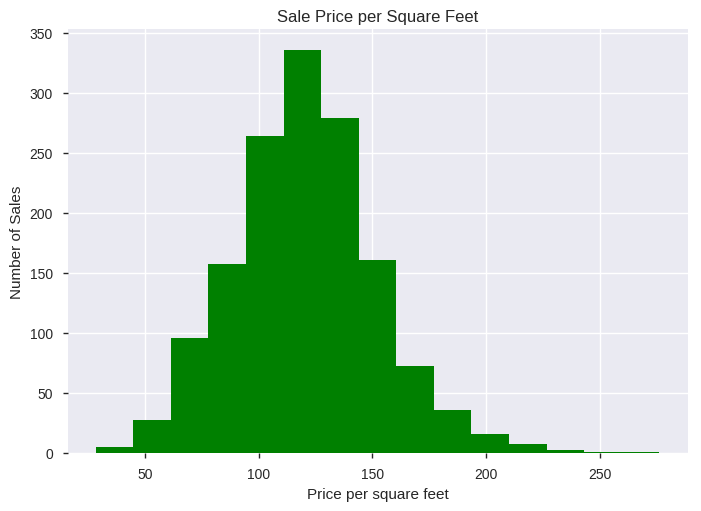

In [47]:
df['SalePriceSF'] = df['SalePrice']/df['GrLivArea']
plt.hist(df['SalePriceSF'], bins=15,color="green")
plt.title("Sale Price per Square Feet")
plt.ylabel('Number of Sales')
plt.xlabel('Price per square feet')

In [48]:
#Average Sale Price per square feet 
print("$",df.SalePriceSF.mean())

$ 120.57287807326834


From the above graph,

We can see that, the average saleprice per square feet is $120.

### **5. Relationship between Ground living area and Total rooms above grade**

In [49]:
configure_plotly_browser_state()
px.scatter(df, x="TotRmsAbvGrd", y="GrLivArea")

From the above graph, we can see that

- Total rooms above grade and ground living area are positively correlated to each other.

- The total rooms above grade increasing with ground living area.



### **6. How Year Built related to sales price?**

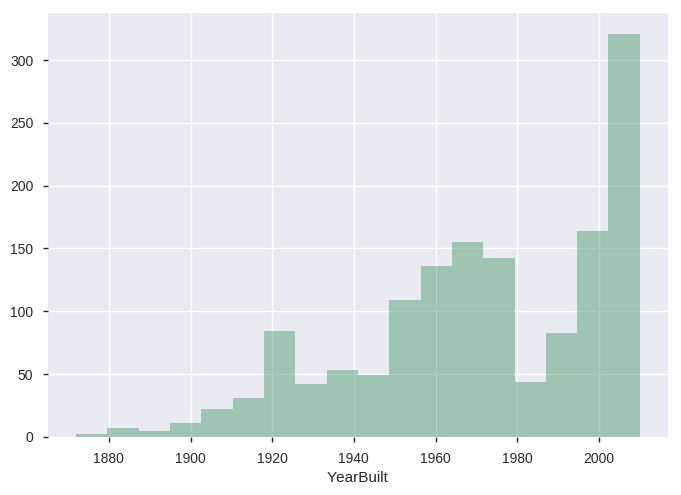

In [50]:
sns.distplot(df["YearBuilt"],color='seagreen', kde=False)

In [51]:
configure_plotly_browser_state()
px.scatter(df, x="YearBuilt", y="SalePrice")

From the above graph, we can say that

- Year built and sale price are negatively correlated to each other.

- Number of houses building is increasing year by year.

### **7. How garage area is related to sale price?**

In [52]:
configure_plotly_browser_state()
px.scatter(df, x="GarageArea", y="SalePrice")

From the above graph, we can see that,

- Garage aarea and SalePrice are in linear relationship with each other.

- As the garage area is increasing,the saleprice of the house is also increasing.

- Even we can see that some houses does not have Garage area.

**There are some outliers in the data, so it is better to remove them for good distribution.**

In [53]:
# by consdering 99 percentile, we are removing outliers
upperlimit = np.percentile(df["GarageArea"].values, 99)
df["GarageArea"].ix[df["GarageArea"]>upperlimit] = upperlimit

configure_plotly_browser_state()
px.scatter(df, x="GarageArea", y="SalePrice")

From the above graph, we can see that, the outliers has been removed an the distribution is looking better.

### 8. How Garage Cars related to Sale price?

In [54]:
configure_plotly_browser_state()
px.scatter(df, x="GarageCars", y="SalePrice")

From the above graph, We can say that

- As the number of Garage cars increases, the sale rice is also increasing 

### Analyzing the relationship between Garage Area and Garage cars 

In [55]:
configure_plotly_browser_state()
px.scatter(df, x="GarageCars", y="GarageArea")

From the above graph, we can see that

- Garage area and Garage cars are positively correlated toeach other.

- As garage area increases,the number of garage cars is also increasing.

### **9. How total number of bathrooms impact the sale price of the house?**

In [0]:
df['TotalBath']=df['BsmtFullBath']+0.5*df['BsmtHalfBath']+df['FullBath']+0.5*df['HalfBath']

In [57]:
configure_plotly_browser_state()
px.scatter(df, x="GrLivArea", y="SalePrice", size ="1stFlrSF" ,color="TotalBath",
           hover_data=['GarageArea','TotalBsmtSF'], log_x=True, size_max=60)


From the above graph,

We can check all the details of particular house like whether the hous has fullbath or halfbath,Ground living area,1st Floor SF, Garage area, Total basement area in SF and Sale price of the house.



### Price Segments

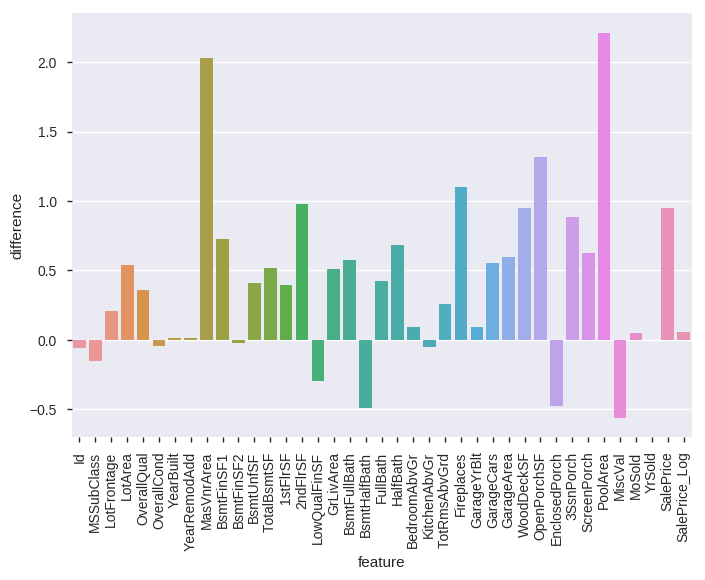

In [58]:
features = numerical

standard = df[df['SalePrice'] < 200000]
pricey = df[df['SalePrice'] >= 200000]

diff = pd.DataFrame()
diff['feature'] = features
diff['difference'] = [(pricey[f].fillna(0.).mean() - standard[f].fillna(0.).mean())/(standard[f].fillna(0.).mean())
                      for f in features]

sns.barplot(data=diff, x='feature', y='difference')
x=plt.xticks(rotation=90)

Here houses are divided in two price groups: cheap (under 200000) and expensive. Then means of numerical variables are compared. Expensive houses have pools, better overall qual and condition, open porch and increased importance of MasVnrArea.

## Modeling

**Importing Packages**

In [0]:
#importing all the required ML packages
from sklearn.linear_model import LinearRegression #linear regression
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn.model_selection import train_test_split #training and testing data split
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix

In [0]:
X= df[["OverallQual","GrLivArea","GarageCars",
                  "GarageArea","TotalBsmtSF","1stFlrSF","FullBath",
                  "YearBuilt","YearRemodAdd","TotRmsAbvGrd"]]

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X)
df1 = scaler.transform(X)

In [61]:
y=df["SalePrice_Log"]
y.head()

0    12.247694
1    12.109011
2    12.317167
3    11.849398
4    12.429216
Name: SalePrice_Log, dtype: float64

### Splitting X & y into training & test dataset


In [0]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=7)

In [63]:
print(X_train.shape)
print(y_train.shape)

print(X_test.shape)
print(y_test.shape)

(1168, 10)
(1168,)
(292, 10)
(292,)


In [64]:
X_train.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,YearBuilt,YearRemodAdd,TotRmsAbvGrd
1087,8,1953,3,1002.79,1082.0,1082,2,2005,2006,9
187,5,1656,1,180.00,660.0,808,2,1916,1987,8
671,6,1369,1,300.00,672.0,697,2,1925,1950,6
652,7,1716,2,512.00,880.0,909,2,1996,1996,7
1266,7,1889,1,308.00,925.0,964,1,1910,1950,9


In [65]:
X_test.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,YearBuilt,YearRemodAdd,TotRmsAbvGrd
606,5,1040,2,576.0,1040.0,1040,1,1996,1996,6
1210,6,1845,2,462.0,1055.0,1055,2,1992,1992,8
492,6,1456,2,429.0,728.0,728,2,2006,2006,8
410,5,1276,1,350.0,1276.0,1276,1,1958,1958,5
396,5,894,2,600.0,894.0,894,1,1972,1972,6


### Linear Regression

In [66]:
%time
from sklearn.linear_model import LinearRegression
Lin_model = LinearRegression()
Lin_model_fit=Lin_model.fit(X_train, y_train) 
y_pred_test = Lin_model.predict(X_test) 
y_pred_train = Lin_model.predict(X_train)  
RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE for training set is {}'.format(RMSE_train))
print('RMSE for test set is {}'.format(RMSE_test))


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.63 µs
RMSE for training set is 0.16391100875547404
RMSE for test set is 0.1644322709146327


**With Gridsearch**

In [67]:
%time
from sklearn.model_selection import GridSearchCV
parameters = {'fit_intercept':[True,False],'normalize':[True,False], 'copy_X':[True, False]}
gs_model = GridSearchCV(Lin_model,parameters, cv = 10,refit = True)
gs_model.fit(X_train, y_train)                                                           # fit the model to the training data (learn the coefficients)
print("Mean cross-validated score of the best_estimator : ", gs_model.best_score_)  
y_pred_test = gs_model.predict(X_test)    # make predictions on the testing set
y_pred_train = gs_model.predict(X_train)
RMSE_train = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
print('RMSE for training set is {}'.format(RMSE_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))                          # compute the RMSE of our predictions
print('RMSE for the test set is {}'.format(RMSE_test))

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 6.2 µs
Mean cross-validated score of the best_estimator :  0.809943465520984
RMSE for training set is 0.16391100875547404
RMSE for the test set is 0.1644322709146327


## Decision Tree Regression

In [0]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error


In [69]:
%time
# Specify Model
DT_model = DecisionTreeRegressor(criterion='mse', random_state=0,max_leaf_nodes=100)
# Fit Model
DT_fit=DT_model.fit(X_train, y_train)
y_pred_test = DT_model.predict(X_test) 
y_pred_train = DT_model.predict(X_train)  
RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE for training set is {}'.format(RMSE_train))
print('RMSE for test set is {}'.format(RMSE_test))

# Make validation predictions and calculate mean absolute error
val_predictions = DT_model.predict(X_test)
val_mae = mean_absolute_error(val_predictions, y_test)
print("Validation MAE: {:,.0f}".format(val_mae))


CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 7.87 µs
RMSE for training set is 0.10638677188926055
RMSE for test set is 0.1854706992089008
Validation MAE: 0


In [70]:
from sklearn.model_selection import cross_val_score
dt_scores = cross_val_score(DT_fit, X_train, y_train, cv = 5)
print("mean cross validation score: {}".format(np.mean(dt_scores)))
print("score without cv: {}".format(DT_fit.score(X_train, y_train)))

mean cross validation score: 0.7003912540469328
score without cv: 0.928061877128352


**With GridsearchCV**

In [71]:
DT_cv = GridSearchCV(DecisionTreeRegressor(criterion='mse', random_state=0),
              param_grid={"min_samples_split": [10, 20, 40],
              "max_depth": [2, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100]},
               cv=5, refit=True)

DT_cv.fit(X_train, y_train)
DT_cv.best_params_
print("Mean cross-validated score of the best_estimator : ", DT_cv.best_score_)

Mean cross-validated score of the best_estimator :  0.7503191814177872


In [72]:
y_pred_test = DT_cv.predict(X_test)    # make predictions on the testing set
y_pred_train = DT_cv.predict(X_train)
RMSE_train = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
print('RMSE for training set is {}'.format(RMSE_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))                          # compute the RMSE of our predictions
print('RMSE for the test set is {}'.format(RMSE_test))

RMSE for training set is 0.16325816366584933
RMSE for the test set is 0.18460471211352325


### RandomForestRegression




In [82]:
from sklearn.ensemble import RandomForestRegressor
%time
RF_model = RandomForestRegressor(max_depth=2, random_state=0,n_estimators=100)
RF_model.fit(X_train, y_train) 
y_pred_test = RF_model.predict(X_test) 
y_pred_train = RF_model.predict(X_train)  
RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE for training set is {}'.format(RMSE_train))
print('RMSE for test set is {}'.format(RMSE_test))

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 9.54 µs
RMSE for training set is 0.22680088152241049
RMSE for test set is 0.22811753781158273


**With GridsearchCV**

In [83]:
%time
RF_cv = GridSearchCV( RandomForestRegressor(criterion='mse', random_state=0),
              param_grid={"n_estimators"      : [10,20,30],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False]},
               cv=5, refit=True)

RF_cv.fit(X_train, y_train)
RF_cv.best_params_
print("Mean cross-validated score of the best_estimator : ", RF_cv.best_score_)
RF_cv.fit(X_train, y_train) 
y_pred_test = RF_cv.predict(X_test) 
y_pred_train = RF_cv.predict(X_train)  
RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE for training set is {}'.format(RMSE_train))
print('RMSE for test set is {}'.format(RMSE_test))

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 10 µs
Mean cross-validated score of the best_estimator :  0.8278511065243848
RMSE for training set is 0.09785979520081396
RMSE for test set is 0.16631890807339644


### Combining all 3 Algorithms

In [75]:
from sklearn.tree import DecisionTreeRegressor    #D.Tree
from sklearn.ensemble import RandomForestRegressor #Forest
from sklearn.linear_model import LinearRegression    #Logistic Regression

#Importing Model Validation
from sklearn.metrics import accuracy_score, log_loss, confusion_matrix
from sklearn.model_selection import cross_val_score

#Initial Model Object from Class
Rgr_dtree = DecisionTreeRegressor()
Rgr_forest = RandomForestRegressor()
Rgr_linreg = LinearRegression()

Regressors = [
    DecisionTreeRegressor(),
    RandomForestRegressor(),
    LinearRegression(),
    ]

regressors = [Rgr_dtree, Rgr_forest, Rgr_linreg]
    
#Step 2. Delcare parameters for training and do a hyperparameter tuning by gridsearch
# You can change your parameters here!!!
params_dtree = [{"criterion": ["mse"],"min_samples_split": [10, 20, 40],"max_depth": [2, 6, 8],"min_samples_leaf": [20, 40, 100],
                 "max_leaf_nodes": [5, 20, 100]}]
params_forest = [{"n_estimators"      : [10,20,30],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False],'criterion':['mse']}]
params_linreg = [{'fit_intercept':[True,False],'normalize':[True,False], 'copy_X':[True, False]}]

parameters = [
        params_dtree,
        params_forest,
        params_linreg,
        ]

#Step 2. Training model using gridsearch
#Importing Grid Search
from sklearn.model_selection import GridSearchCV

Rgr_best_acc = []
Rgr_best_params = []
Rgr_best_estimator = []

        
grid_searchs = [] #grid_search_knns, grid_search_dtree, grid_search_forest, grid_search_svm, grid_search_logreg, grid_search_naive

#Training and append all of the best result from each model to a list
for i in range(len(regressors)):
    grid_searchs.append(GridSearchCV(estimator=regressors[i], param_grid=parameters[i], cv=10, 
                                n_jobs=-1))   
    grid_searchs[i].fit(X,y)

    Rgr_best_acc.append(grid_searchs[i].best_score_)
    Rgr_best_params.append(grid_searchs[i].best_params_)
    Rgr_best_estimator.append(grid_searchs[i].best_estimator_)
 
print("Finishing Training")

Finishing Training


In [76]:
#best_regressor variable for storing best regressor from gridsearch as a dict : Key is the name of regressor, Value is list of [best accuracy, best parameters, best estimators]
best_regressor = {}

#Store each regressor in dictionary 
for i in range(len(regressors)):
    best_regressor[regressors[i].__class__.__name__] = [Rgr_best_acc[i], Rgr_best_params[i], Rgr_best_estimator[i]]

#Print out the result of each best classifier can do!!!
for key, value in best_regressor.items():
    print("Regressor name : " + str(key), end="\n")
    print("Best parameters : " + str(value[1]), end="\n")    #value[1] is best parameters
    print("Best estimator : " + str(value[2]), end="\n")    #value[2] is best estimators
    print("************************************************************************************************", end="\n")
   

Regressor name : DecisionTreeRegressor
Best parameters : {'criterion': 'mse', 'max_depth': 8, 'max_leaf_nodes': 100, 'min_samples_leaf': 20, 'min_samples_split': 40}
Best estimator : DecisionTreeRegressor(criterion='mse', max_depth=8, max_features=None,
                      max_leaf_nodes=100, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=20,
                      min_samples_split=40, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')
************************************************************************************************
Regressor name : RandomForestRegressor
Best parameters : {'bootstrap': True, 'criterion': 'mse', 'max_features': 'log2', 'min_samples_split': 4, 'n_estimators': 30}
Best estimator : RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='log2', max_leaf_nodes=None,
                      min_impurity_decrease=0.0,

### Best Model

In [77]:
%time
# Specify Model
DT_model = DecisionTreeRegressor(criterion='mse', max_depth=8, max_features=None,
                      max_leaf_nodes=100, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=20,
                      min_samples_split=40, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')
# Fit Model
DT_fit=DT_model.fit(X_train, y_train)
y_pred_test = DT_model.predict(X_test) 
y_pred_train = DT_model.predict(X_train)  
RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE for training set is {}'.format(RMSE_train))
print('RMSE for test set is {}'.format(RMSE_test))

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 8.58 µs
RMSE for training set is 0.16325816366584936
RMSE for test set is 0.1846047121135233


## Conclusion

- We have 80 features in the data, but i would be considering only 10 important features for our analysis as per business sense.

- According to the correlation, some features have high correlation with  the class variable ie Sale price and those features are Overall Quality, Ground living area, Total basement area, Garage Cars and Garage Area etc

- As per EDA, we can conclude that, correlation shift with change of Sale price. For example, we can see that Overall Quality is highly correlated to Sale Price means sale price is highly dependent on the overall quality of the house. Overall Quality rates the overall material and finish of the house (1 = Very Poor, 10 = Very Excellent).

- For the prediction, we applied modeling algorithms like Linear regression,Decision Tree & Random Forest to the data and from the modeling we can conclude that, Decision tree is the best model for the prediction of Sale price of the house because of following reasons:

 - Its the Quickest
 - It is explainable compare to Random Forest.
 - If we can see the RMSE, its the lowest means it is more accurate than the rest.